In [7]:
import librosa
import numpy as np
from scipy.io import wavfile
import IPython

#name = './stedman9.wav'
#cambridge, sr = librosa.load(name)

# This is a touch of Stedman triples on our back 8.
five_name = '/Users/gfr/Google Drive/ny striking/single bells/five.wav'
five_sr, five = wavfile.read(five_name)
print(five.shape, five_sr)
five_left = five[:,0]/(32*1024.0)
five_right = five[:,1]/(32*1024.0)
print np.max(five_left)

#alt, alt_sr = librosa.load(name)
#IPython.display.Audio(data=alt, rate=alt_sr)


((844544, 2), 48000)
0.329376220703


In [136]:
''' Load audio, compute spectrogram and nmf.'''
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import librosa
import IPython
import math
from scipy import stats
from scipy import linalg
from sklearn.decomposition import NMF
from scipy.cluster.vq import whiten

def spec(clip, sr, width, white=False):
  print(len(clip), max(clip))
  f, t, Sxx = signal.spectrogram(clip, sr, mode='magnitude',
                                 nperseg=width, nfft=width,
                                 noverlap=width-width//8, scaling='density')
  print('frequency resolution is: ', f[1]-f[0])
  # scale by frequency, to get power per octave, or more radical scaling??
  # When scaled by f**3, we get a dramatic percussive signal.  This requires adding another NMF
  # component, that will emphasize the percussive element.  It's inconsistent, though, so probably
  # not worth the trouble.
  # Scaling by f**2, we get very nice definition of the bell spectra.
  if sr == 48000: 
    Sxx = Sxx[:(3*len(f))//4,]
    f = f[:3*len(f)//4]
  if white:
    Sxx = whiten(Sxx.T).T
  else:
    Sxx = np.multiply(Sxx.T, np.arange(len(f))**2).T
    #Sxx = np.sqrt(Sxx)  # Terrible hack
  fig = plt.figure(figsize=(50,10), dpi=120)
  
  print np.percentile(Sxx, 99.9), np.max(Sxx)
  plt.imshow(Sxx, origin='lower', aspect='auto', extent=[0,t[-1],0,f[-1]], cmap='plasma', clim=(0,np.percentile(Sxx,99.9)))
  plt.show()

  plt.figure(figsize=(8,8), dpi=120)
  plt.imshow(np.corrcoef(Sxx), origin='lower', cmap='plasma') 
  plt.colorbar()
  plt.show()

  return f, t, Sxx



(844544, 0.33502197265625)
('frequency resolution is: ', 93.75)
110.098378719 203.104615279


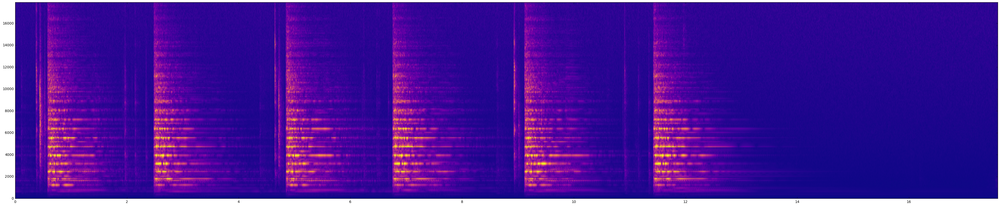

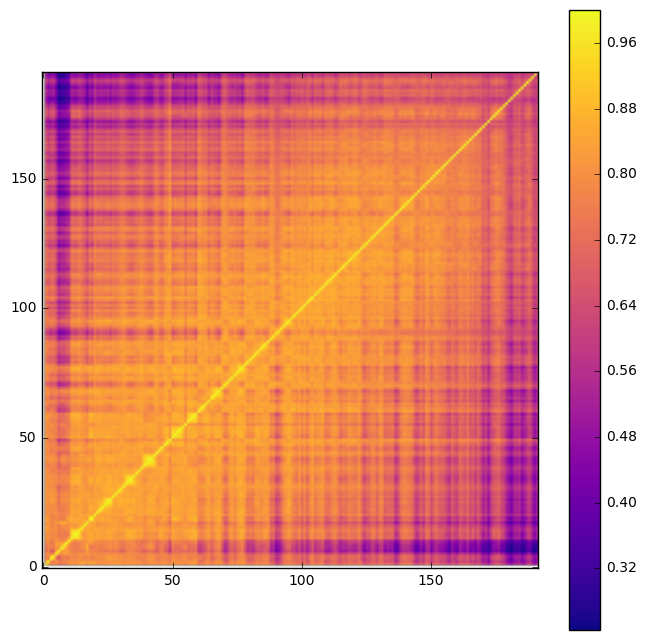

(844544, 0.329376220703125)
('frequency resolution is: ', 93.75)
94.6474206373 162.595753438


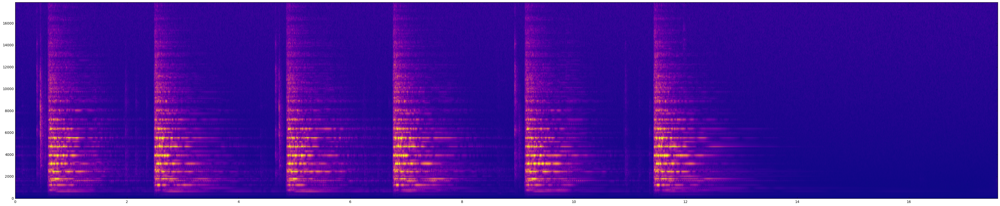

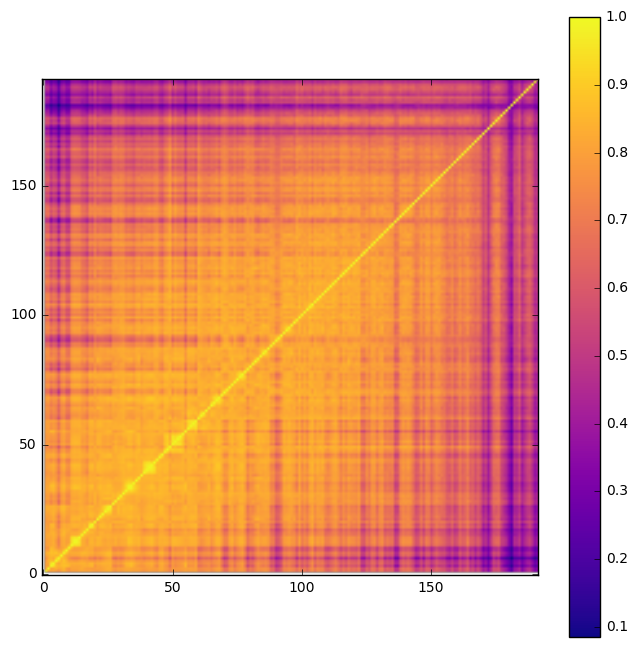

In [70]:
f, t, Sxx = spec(five_right, five_sr, 512, False)
f, t, Sxx = spec(five_left, five_sr, 512, False)


/opt/intel/intelpython27/lib/python2.7/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


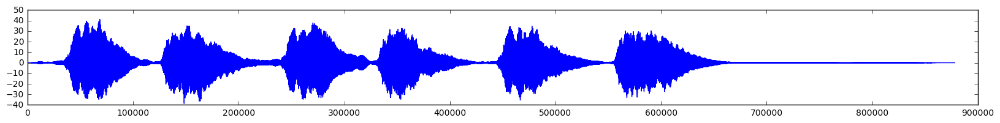

In [33]:
from scipy.signal import fftconvolve

c = fftconvolve(five_right, five_right[11.3*five_sr:12*five_sr], mode='full')
plt.figure(figsize=(20,2), dpi=120)
plt.plot(c) 
plt.show()


8958.13423414 26437.3790361


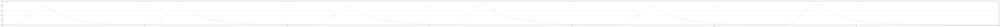

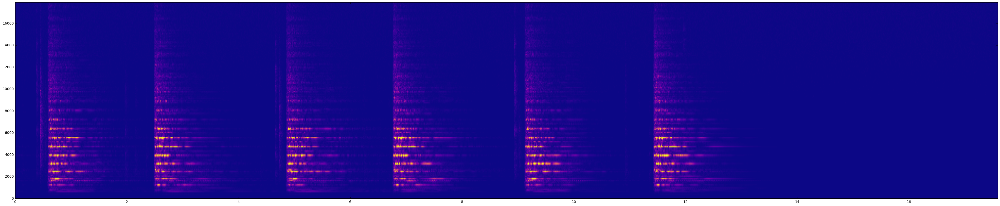

(192, 13189) 750.0
(300, 192)
394121.097579
1.0


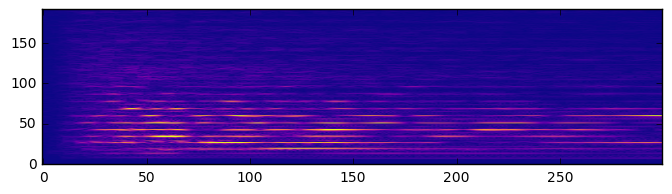

(300, 192)
427620.161423
1.0


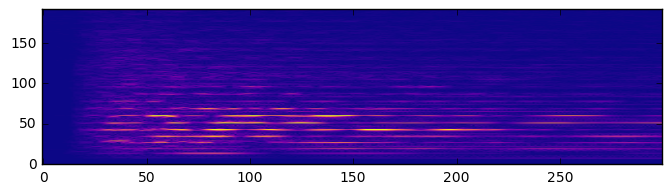

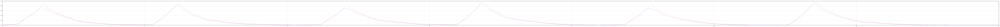

In [154]:

# assumes template is already normalized
def match(template, other):
    r = np.sum(np.multiply(template, other))
  #  print np.linalg.norm(template), np.linalg.norm(other), r
    return r

def match_offset(offset, Sxx, fps):
  template = np.array(Sxx.T[int(offset*fps):int((offset+.4)*fps)])
  print template.shape
  norm = np.sqrt(np.sum(np.multiply(template, template)))
  print norm
  template *= 1/norm
  print match(template, template)

  fig = plt.figure(figsize=(8,2), dpi=120)
  plt.imshow(template.T, origin='lower', aspect='auto', cmap='plasma', clim=(0,np.percentile(template,99.9)))
  plt.show()

  c = []
  for i in np.arange(0*fps, 14*fps, 1):
      c.append(match(template, Sxx.T[int(i):int(i)+template.shape[0]]/norm))
    
  return c

#f, t, Sxx = spec(five_left, five_sr, 512, False)
fps = 1/(t[1]-t[0])
fig = plt.figure(figsize=(50,10), dpi=120)
  
print np.percentile(Sxx, 99.9), np.max(Sxx)
plt.imshow(Sxx, origin='lower', aspect='auto', extent=[0,t[-1],0,f[-1]], cmap='plasma', clim=(0,np.percentile(Sxx,99.9)))
plt.show()

print Sxx.shape, fps
#template = np.array(Sxx.T[int(.57*fps):int(1.5*fps)])
hand = match_offset(.57, Sxx, fps)
back = match_offset(2.46, Sxx, fps)
    
plt.figure(figsize=(200,5), dpi=120)
axes = plt.gca()
#axes.set_xlim([0, t[-1]])
axes.set_ylim([0,1])
plt.grid()
plt.plot(range(len(hand))/fps, hand, 'r,')
plt.plot(range(len(back))/fps, back, 'b,')
plt.show()


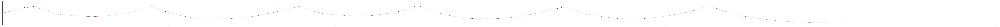

In [132]:
plt.figure(figsize=(200,5), dpi=120)
plt.plot(c, 'r,')
plt.show()
